In [1]:
import copy

import matplotlib.pyplot as plt
import numpy as np
import scanpy as sc
import pandas as pd
from algorithms import *
from data_gen import *
from spectrum_gen import *
from visualizations import *
from analysis import *


In [14]:
def plots_two_clusters_scn(clusters,  title , r_genes ):
    adata = sc.read("SCN/" + clusters+"_en" +".h5ad")
    sc.pp.neighbors(adata)
    sc.tl.pca(adata)
    sc.pl.pca_scatter(adata, color='CT' , title=("PCA of " + title + " painted by CT") , legend_fontsize='x-large')
    sc.pl.pca_scatter(adata, color='louvain' , title=("PCA of " + title + " painted by cell type"), legend_fontsize='x-large')
    sc.tl.tsne(adata)
    sc.pl.tsne(adata, color='CT' , title=("TSNE of " + title + " painted by CT"), legend_fontsize='x-large')
    sc.pl.tsne(adata, color='louvain' , title=("TSNE of " + title + " painted by cell type"), legend_fontsize='x-large')
    for gene in r_genes:
        try:
            print(gene)
            sc.pl.pca_scatter(adata, color=gene, title=("PCA of " + title + " painted by " + gene), legend_fontsize='x-large')
            sc.pl.tsne(adata, color=gene , title=("TSNE of " + title + " painted by " + gene), legend_fontsize='x-large')
        except:
            print(gene)
    pass

def plots_double_clusters_scn_en(cluster1, cluster2,  title ):
    adata_en = sc.read("SCN/" + cluster1 + "_" + cluster2 +"_double_en" +".h5ad")
    sc.pp.neighbors(adata_en)
    sc.tl.pca(adata_en)
    sc.pl.pca_scatter(adata_en, color='CT' , title=("PCA of enhanced " + title + ", painted by CT") , legend_fontsize='x-large')
    sc.pl.pca_scatter(adata_en, color='louvain' , title=("PCA of enhanced " + title + ", painted by cell type"), legend_fontsize='x-large')
    sc.tl.tsne(adata_en)
    sc.pl.tsne(adata_en, color='CT' , title=("TSNE of enhanced " + title + " painted by CT"), legend_fontsize='x-large')
    sc.pl.tsne(adata_en, color='louvain' , title=("TSNE of enhanced " + title + " painted by cell type"), legend_fontsize='x-large')
    pass

def plots_double_clusters_scn_raw(cluster1, cluster2,  title ):
    adata = sc.read("SCN/" + cluster1 + " and " + cluster2 +"_raw" +".h5ad")
    sc.pp.neighbors(adata)
    sc.tl.pca(adata)
    sc.pl.pca_scatter(adata, color='CT' , title=("PCA of raw " + title + ", painted by CT") , legend_fontsize='x-large')
    sc.pl.pca_scatter(adata, color='louvain' , title=("PCA of raw " + title + ", painted by cell type"), legend_fontsize='x-large')
    sc.tl.tsne(adata)
    sc.pl.tsne(adata, color='CT' , title=("TSNE of raw " + title + " painted by CT"), legend_fontsize='x-large')
    sc.pl.tsne(adata, color='louvain' , title=("TSNE of raw " + title + " painted by cell type"), legend_fontsize='x-large')
    pass

def double_cyclic_cov(n1=500 , n2=500 , alpha=0.99):
    cov = np.zeros((n1+n2,n1+n2))
    cov1 = cyclic_cov(n1,alpha)
    cov2 = cyclic_cov(n2,alpha)
    cov1_min = np.mean(cov1)
    cov2_min = np.mean(cov2)
    cov_min = min(cov1_min,cov2_min)
    cov[:n1,n1:]=cov_min
    cov[n1:,:n1]=cov_min
    cov[:n1,:n1]=cov1
    cov[n1:,n1:]=cov2
    return cov

def cyclic_cov(n,alpha=0.99):
    cov = np.zeros((n,n))
    if n%2==1:
        c_vec = np.concatenate((np.arange(int(n/2)+1),np.arange(int(n/2),0,-1)))
    else:
        c_vec = np.concatenate((np.arange(int(n/2)),np.arange(int(n/2),0,-1)))
    c_vec = alpha**c_vec
    for i in range(n):
        cov[i,:]=np.roll(c_vec,i)
    return cov

def arragnge_two_clusters_for_enhancement(adata,cluster1,cluster2, alpha):
    adata_1 = (adata[adata.obs['louvain'].isin([cluster1])])    
    adata_1 = sort_data_crit(adata=adata_1.copy(), crit='CT',
                                 crit_list=['02', '06', '10', '14', '18', '22'])

    adata_2 = (adata[adata.obs['louvain'].isin([cluster2])])
    adata_2 = sort_data_crit(adata=adata_2.copy(), crit='CT',
                                 crit_list=['02', '06', '10', '14', '18', '22'])
    adata_both = adata_1.concatenate(adata_2)
    cov = double_cyclic_cov(adata_1.X.shape[0],adata_2.X.shape[0], alpha)
    
    return adata_both , cov

def enhance_two_cyclic_scn(adata,cluster1,cluster2, r_genes, en_regu=0.1, iterNum=100,alpha=0.99 , hvg=7000):
    adata_both , cov = arragnge_two_clusters_for_enhancement(adata,cluster1,cluster2, alpha)
    sc.pp.filter_genes_dispersion(adata_both, n_top_genes=hvg)
    plots_adata_scn(adata_both, r_genes=r_genes, title=cluster1 + " " + cluster2 + " enhanced")
    VT = get_theoretic_eigen(cov)
    VT= VT[:,1:]
    F =enhance_general_topology(adata_both.X, VT, regu=en_regu, iterNum=iterNum )
    adata_enhanced = adata_both.copy()
    adata_enhanced.X = adata_enhanced.X * F
    adata_enhanced.write("SCN/" + cluster1 + "_" + cluster2 +"_double_en" +".h5ad")
    plots_adata_scn(adata_enhanced, r_genes=r_genes, title=cluster1 + " " + cluster2 + " enhanced")
    return adata_enhanced

    
def get_theoretic_eigen (cov, n_values=None):
    if n_values==None:
        n_values= cov.shape[0]
    eig_vals, eig_vecs = linalg.eigh(cov)
    idx = eig_vals.argsort()[::-1]   
    eig_vals = eig_vals[idx]
    eig_vecs = eig_vecs[:,idx]
    eig_vals = eig_vals[:n_values]
    eig_vecs = eig_vecs[:,:n_values]
    eig_vals = np.real(eig_vals)
    eig_vecs = np.real(eig_vecs)
    for i in range(eig_vals.size):
            if(eig_vals[i]<0):
                eig_vals[i]=0
            eig_vecs[:, i] *= np.sqrt(eig_vals[i])
    return eig_vecs

def enhance_general_topology(A, V, regu=0.5, iterNum=300 ):
    A = cell_normalization(A)
    
    F = stochastic_gradient_ascent_full(A, F=np.ones(A.shape), V=V, regu=regu, iterNum=iterNum)
    return F

def plots_two_clusters_scn(clusters,  title , r_genes ):
    adata = sc.read("SCN/" + clusters+"_en" +".h5ad")
    sc.pp.neighbors(adata)
    sc.tl.pca(adata)
    sc.pl.pca_scatter(adata, color='CT' , title=("PCA of " + title + " painted by CT") , legend_fontsize='x-large')
    sc.pl.pca_scatter(adata, color='louvain' , title=("PCA of " + title + " painted by cell type"), legend_fontsize='x-large')
    sc.tl.tsne(adata)
    sc.pl.tsne(adata, color='CT' , title=("TSNE of " + title + " painted by CT"), legend_fontsize='x-large')
    sc.pl.tsne(adata, color='louvain' , title=("TSNE of " + title + " painted by cell type"), legend_fontsize='x-large')
    for gene in r_genes:
        try:
            print(gene)
            sc.pl.pca_scatter(adata, color=gene, title=("PCA of " + title + " painted by " + gene), legend_fontsize='x-large')
            sc.pl.tsne(adata, color=gene , title=("TSNE of " + title + " painted by " + gene), legend_fontsize='x-large')
        except:
            print(gene)
    pass

def plots_adata_scn(adata,  title , r_genes ):
    sc.pp.neighbors(adata)
    sc.tl.pca(adata)
    sc.pl.pca_scatter(adata, color='CT' , title=("PCA of " + title + " painted by CT") , legend_fontsize='x-large')
    sc.pl.pca_scatter(adata, color='louvain' , title=("PCA of " + title + " painted by cell type"), legend_fontsize='x-large')
    sc.tl.tsne(adata)
    sc.pl.tsne(adata, color='CT' , title=("TSNE of " + title + " painted by CT"), legend_fontsize='x-large')
    sc.pl.tsne(adata, color='louvain' , title=("TSNE of " + title + " painted by cell type"), legend_fontsize='x-large')
    for gene in r_genes:
        try:
            print(gene)
            sc.pl.pca_scatter(adata, color=gene, title=("PCA of " + title + " painted by " + gene), legend_fontsize='x-large')
            sc.pl.tsne(adata, color=gene , title=("TSNE of " + title + " painted by " + gene), legend_fontsize='x-large')
        except:
            print(gene)
    pass

def plt_mean_gene_double(adata_both, cluster1, cluster2 , gene , down_lim=0, up_lim=3, color='b'):
    ct_list = ['02', '06', '10', '14', '18', '22']
    e_array = np.zeros(6)
    var_array = np.zeros(6)
    for i, ct in enumerate(ct_list):
        adata_nr = (adata_both[adata_both.obs['CT'].isin([ct])])
        e_array[i] = float(np.mean(adata_nr[:, gene].X))
        var_array[i] = float(np.var(adata_nr[:, gene].X))
    plt.figure()
    plt.subplot(211)
    plt.plot(ct_list, e_array, 'k')
    #plt.plot(ct_list, e_array, 'bo', color='b')  # ct_list, dbp_array, 'k')
    plt.errorbar(ct_list, e_array, var_array, color=color,linestyle='None', marker='^')
    plt.ylim([down_lim, up_lim])
    plt.title("Mean "+ gene + " expression on both enhanced " + cluster1 + " " +cluster2+ " data")
    plt.ylabel("Gene expression", fontsize=14)
    plt.xlabel("Circadian time" , fontsize=14)
    plt.show()
    adata_cluster1 = adata_both[adata_both.obs['louvain'].isin([cluster1])]
    ct_list = ['02', '06', '10', '14', '18', '22']
    e_array = np.zeros(6)
    var_array = np.zeros(6)
    for i, ct in enumerate(ct_list):
        adata_nr = (adata_cluster1[adata_cluster1.obs['CT'].isin([ct])])
        e_array[i] = float(np.mean(adata_nr[:, gene].X))
        var_array[i] = float(np.var(adata_nr[:, gene].X))
    plt.figure()
    plt.subplot(211)
    plt.plot(ct_list, e_array, 'k')
    #plt.plot(ct_list, e_array, 'bo', color='b')  # ct_list, dbp_array, 'k')
    plt.errorbar(ct_list, e_array, var_array, color=color,linestyle='None', marker='^')
    plt.ylim([down_lim, up_lim])
    plt.title("Mean "+ gene + " expression on enhanced " + cluster1 + " data")
    plt.ylabel("Gene expression", fontsize=14)
    plt.xlabel("Circadian time" , fontsize=14)
    plt.show()
    adata_cluster2 = adata_both[adata_both.obs['louvain'].isin([cluster2])]
    ct_list = ['02', '06', '10', '14', '18', '22']
    e_array = np.zeros(6)
    var_array = np.zeros(6)
    for i, ct in enumerate(ct_list):
        adata_nr = (adata_cluster2[adata_cluster2.obs['CT'].isin([ct])])
        e_array[i] = float(np.mean(adata_nr[:, gene].X))
        var_array[i] = float(np.var(adata_nr[:, gene].X))
    plt.figure()
    plt.subplot(211)
    plt.plot(ct_list, e_array, 'k')
    #plt.plot(ct_list, e_array, 'bo', color='b')  # ct_list, dbp_array, 'k')
    plt.errorbar(ct_list, e_array, var_array, color=color,linestyle='None', marker='^')
    plt.ylim([down_lim, up_lim])
    plt.title("Mean "+ gene + " expression on enhanced " + cluster2 + " data")
    plt.ylabel("Gene expression", fontsize=14)
    plt.xlabel("Circadian time" , fontsize=14)
    plt.show()


In [4]:
adata =  read_all_scn_no_obs()
sc.pp.filter_genes(adata, min_cells=3)
sc.pp.filter_cells(adata, min_genes=500)
sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e4)
sc.pp.log1p(adata)
sc.tl.pca(adata, svd_solver='arpack')
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=40)


/Users/jonathankarin/.conda/envs/spctral_jan/lib/python3.9/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],
/Users/jonathankarin/.conda/envs/spctral_jan/lib/python3.9/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],
/Users/jonathankarin/.conda/envs/spctral_jan/lib/python3.9/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.f

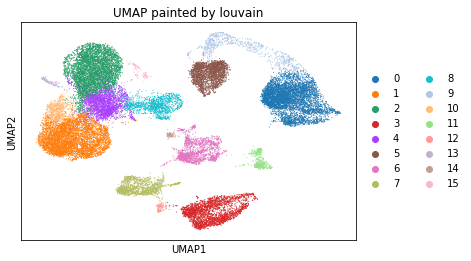

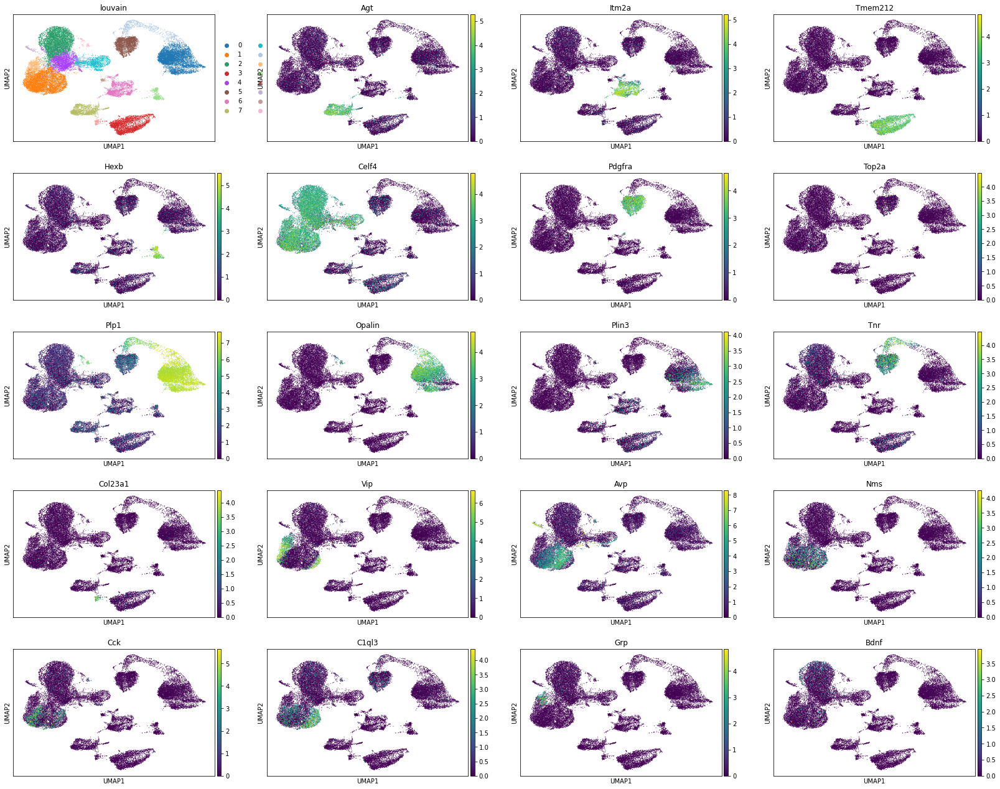

In [5]:
sc.tl.louvain(adata, resolution=0.7)
sc.tl.umap(adata)
sc.pl.umap(adata, color='louvain' , title=("UMAP painted by louvain"))
marker_genes = ['Agt', 'Itm2a','Tmem212','Hexb','Celf4','Pdgfra','Top2a','Plp1','Opalin','Plin3','Tnr','Col23a1','Vip','Avp','Nms','Cck','C1ql3','Grp','Bdnf']
sc.pl.umap(adata, color=['louvain']+marker_genes)


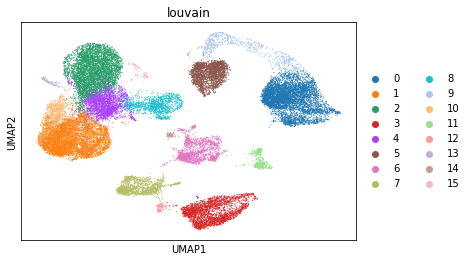

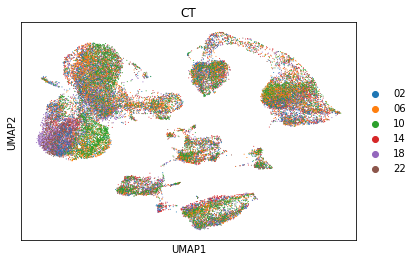

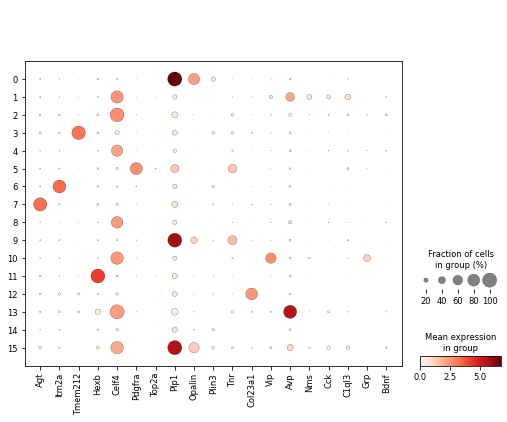

In [6]:
sc.pl.umap(adata, color=['louvain'])
sc.pl.umap(adata, color=['CT'])
sc.pl.dotplot(adata, marker_genes, groupby='louvain')

In [8]:
new_cluster_names = [
    'Oligodendrocytes1','SCN Neurons', 'Neurons2',
    'Ependymal','Neurons3','NG2', 'Endothelial',
    'Astrocytes','Neurons4','Oligodendrocytes2','Neurons5',
    'Microglia','Tanycytes','Neurons6','not_real',
    'Neurons7']
adata.rename_categories('louvain', new_cluster_names)


/Users/jonathankarin/.conda/envs/spctral_jan/lib/python3.9/site-packages/anndata/_core/anndata.py:1160: FutureWarning: The `inplace` parameter in pandas.Categorical.rename_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  self.obs[key].cat.rename_categories(categories, inplace=True)


In [9]:
r_genes = ['Bmal1','Dbp','Nr1d1','Per2','Ciart','Nr1d2','Per1','Tef','Ahsa2','Cct8a','Hsp90aa1','Hsp90ab1','Hsph1']
r_genes2 = ['Dbp','Nr1d1','Per2','Ciart','Nr1d2','Per1','Tef','Ahsa2','Hsp90aa1','Hsp90ab1','Hsph1']
type_genes = ['Agt', 'Itm2a','Tmem212','Hexb','Celf4','Pdgfra','Top2a','Plp1','Opalin','Plin3','Tnr','Col23a1','Vip','Avp','Nms','Cck','C1ql3','Grp','Bdnf']

/Users/jonathankarin/.conda/envs/spctral_jan/lib/python3.9/site-packages/scanpy/preprocessing/_highly_variable_genes.py:208: RuntimeWarning: invalid value encountered in log
  dispersion = np.log(dispersion)
/Users/jonathankarin/.conda/envs/spctral_jan/lib/python3.9/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value
/Users/jonathankarin/PycharmProjects/scPrisma_rev/datasets.py:933: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata_tmp.var.highly_variable[gene]=True
/Users/jonathankarin/PycharmProjects/scPrisma_rev/datasets.py:933: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas

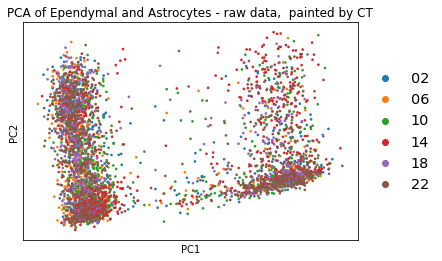

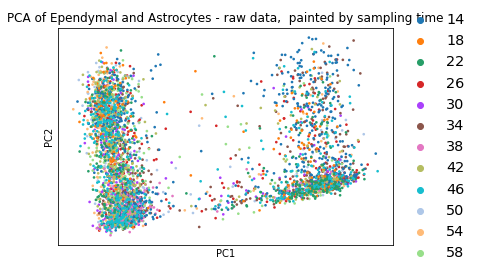

/Users/jonathankarin/.conda/envs/spctral_jan/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(


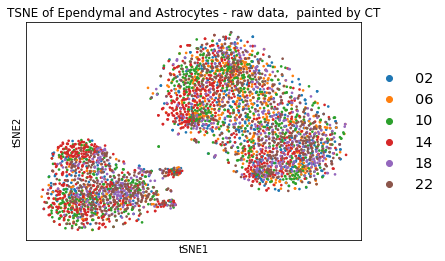

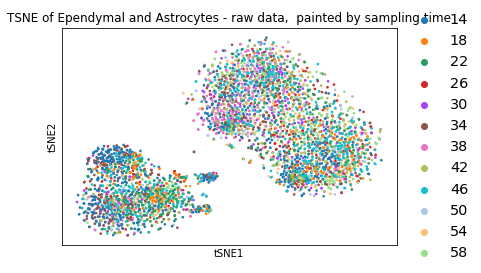

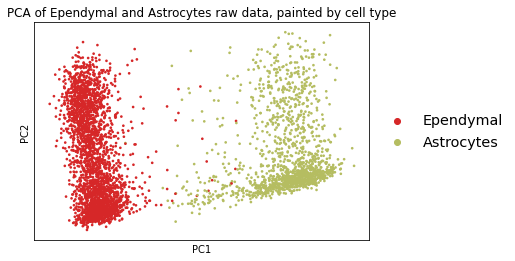

Iteration number: 
1
function value= 
552.7566554118724
Iteration number: 
26
function value= 
618.8953231297719
Iteration number: 
51
function value= 
634.8096691271976
Iteration number: 
76
function value= 
636.6746198018661
Iteration number: 
101
function value= 
636.9887218373871
Iteration number: 
126
function value= 
637.0553155340256
Iteration number: 
151
function value= 
637.0725226723424
Iteration number: 
176
function value= 
637.077770699523
Iteration number: 
1
function value: 
32501.632171755376
Iteration number: 
26
function value: 
220110.4304390562


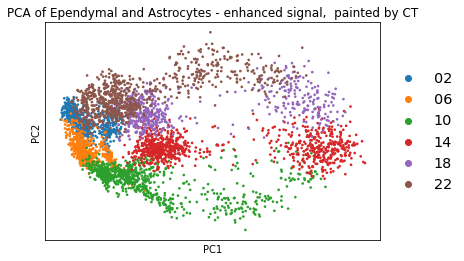

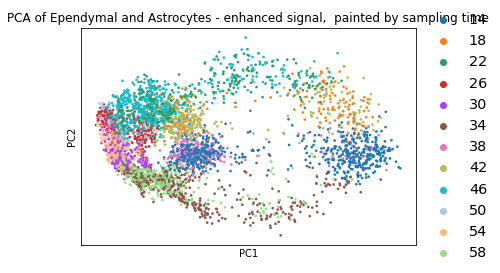

/Users/jonathankarin/.conda/envs/spctral_jan/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(


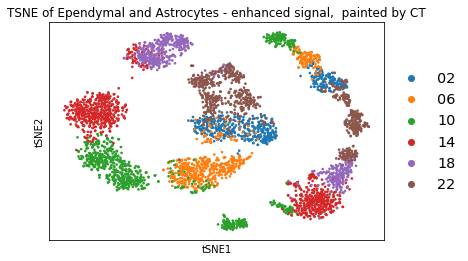

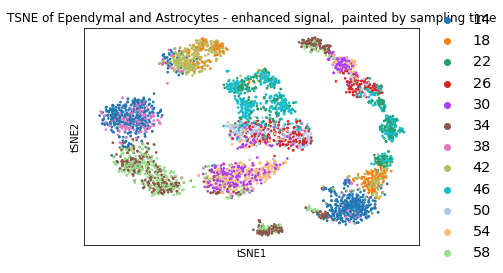

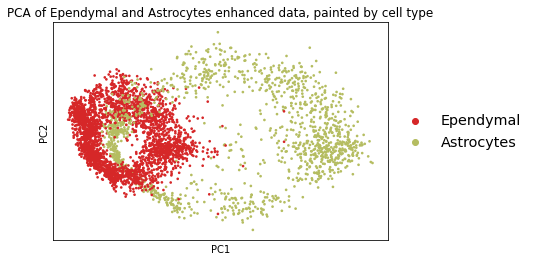

In [25]:
evaluate_multiple_scn_clusters_no_filtering(adata, cluster_list=['Astrocytes', 'Ependymal'],
                                            cluster ='Ependymal and Astrocytes',
                                            type_genes=type_genes, r_genes=r_genes,gene_regu=0.8,en_regu=0.05)


/Users/jonathankarin/.conda/envs/spctral_jan/lib/python3.9/site-packages/scanpy/preprocessing/_highly_variable_genes.py:208: RuntimeWarning: invalid value encountered in log
  dispersion = np.log(dispersion)
/Users/jonathankarin/.conda/envs/spctral_jan/lib/python3.9/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value
/Users/jonathankarin/PycharmProjects/scPrisma_rev/datasets.py:933: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata_tmp.var.highly_variable[gene]=True
/Users/jonathankarin/PycharmProjects/scPrisma_rev/datasets.py:933: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas

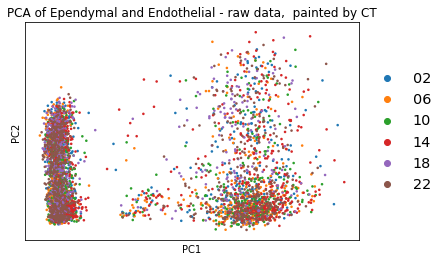

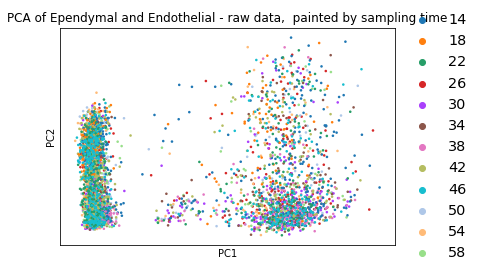

/Users/jonathankarin/.conda/envs/spctral_jan/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(


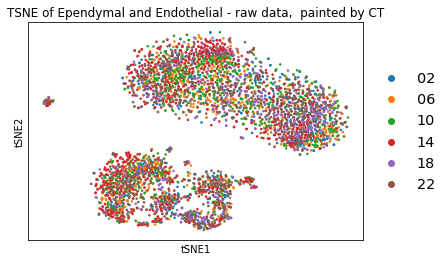

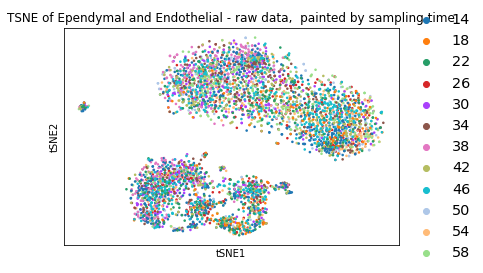

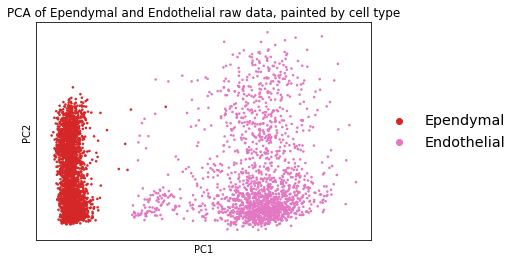

Iteration number: 
1
function value= 
548.5846075391482
Iteration number: 
26
function value= 
647.3591097493796
Iteration number: 
51
function value= 
663.9088704876649
Iteration number: 
76
function value= 
665.7676049502344
Iteration number: 
101
function value= 
666.0768275465829
Iteration number: 
126
function value= 
666.1423572370463
Iteration number: 
151
function value= 
666.1593137814511
Iteration number: 
176
function value= 
666.1644687688371
Iteration number: 
1
function value: 
50925.034425667436
Iteration number: 
26
function value: 
230287.87891901186


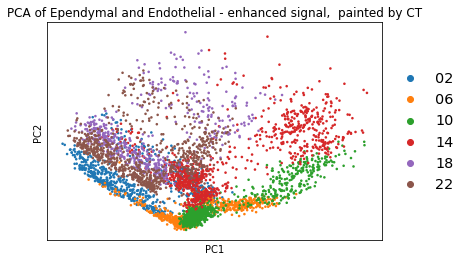

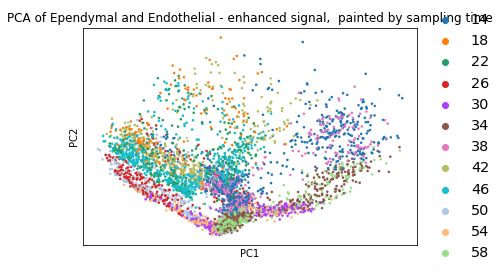

/Users/jonathankarin/.conda/envs/spctral_jan/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(


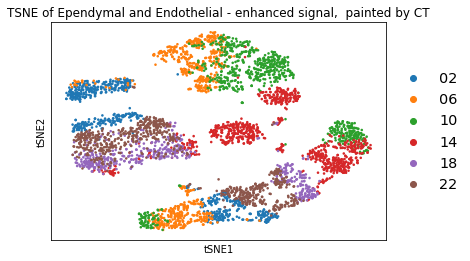

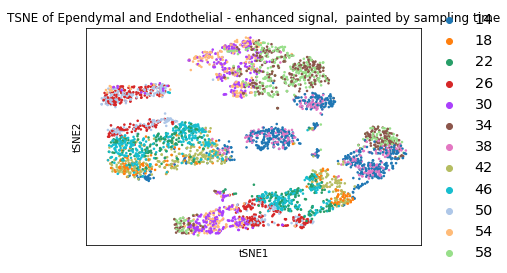

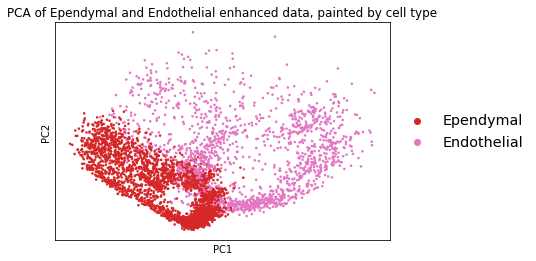

In [26]:
evaluate_multiple_scn_clusters_no_filtering(adata, cluster_list=['Endothelial', 'Ependymal'],
                                            cluster ='Ependymal and Endothelial',
                                            type_genes=type_genes, r_genes=r_genes,gene_regu=0.8,en_regu=0.05)


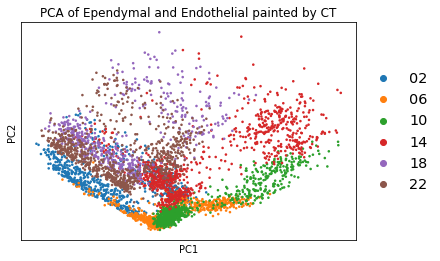

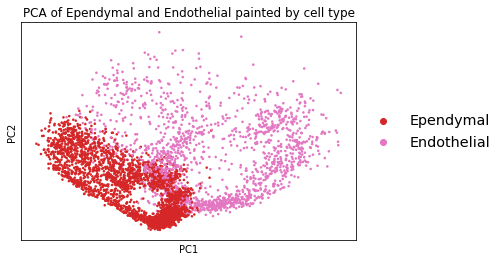

/Users/jonathankarin/.conda/envs/spctral_jan/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(


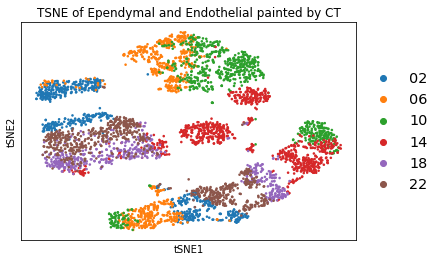

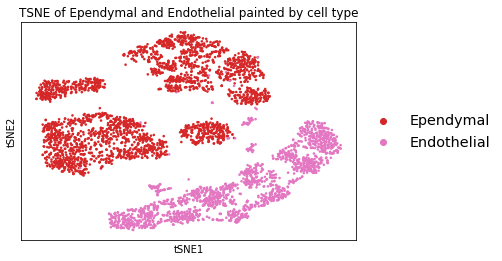

Bmal1
Bmal1
Dbp


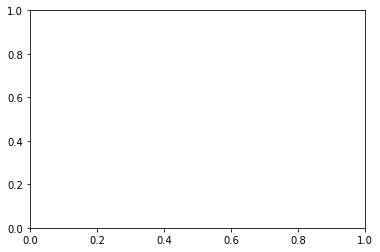

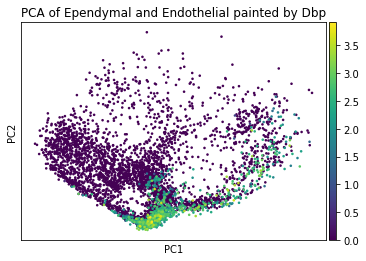

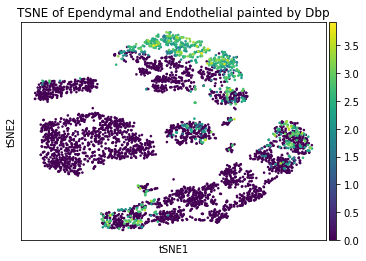

Nr1d1


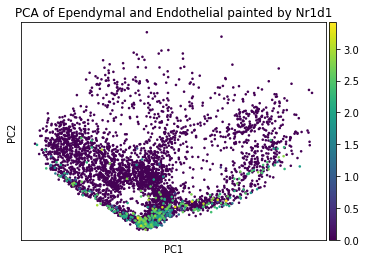

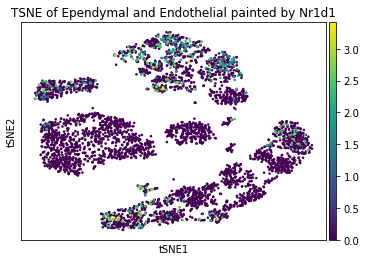

Per2


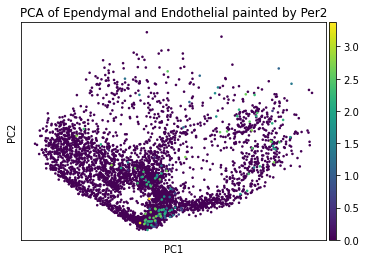

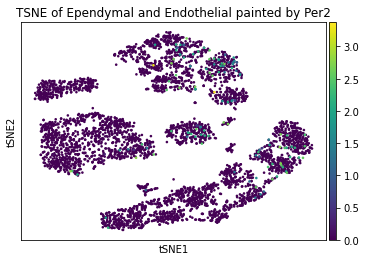

Ciart


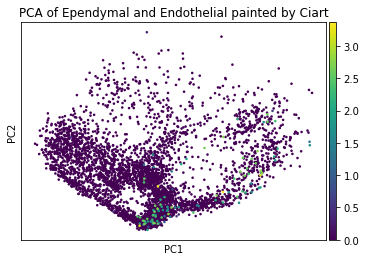

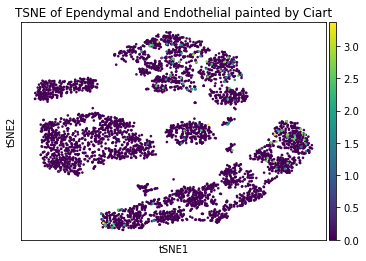

Nr1d2


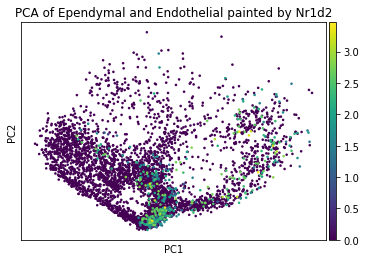

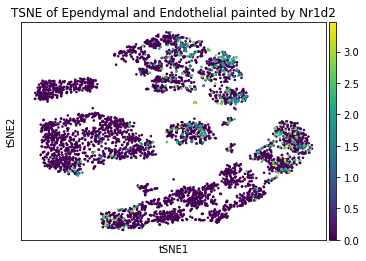

Per1


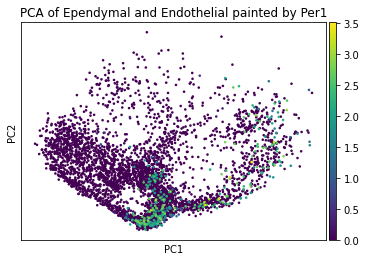

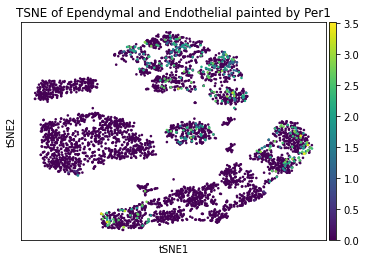

Tef


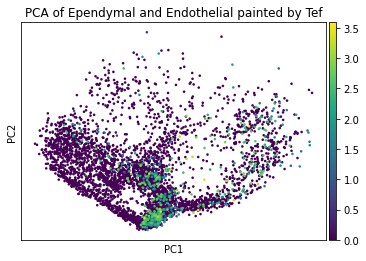

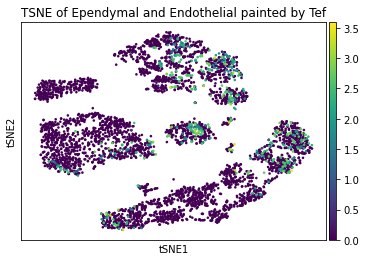

Ahsa2


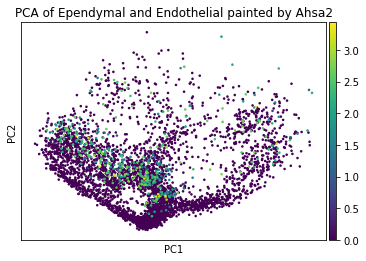

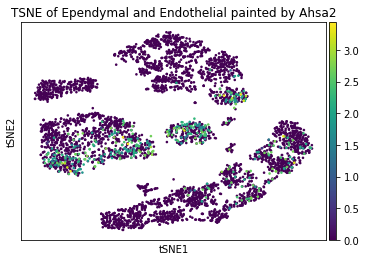

Cct8a
Cct8a
Hsp90aa1


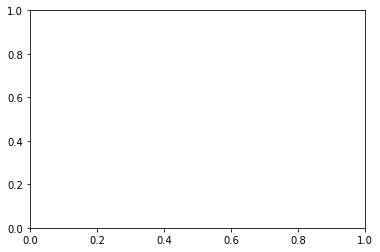

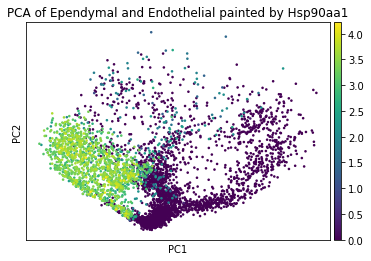

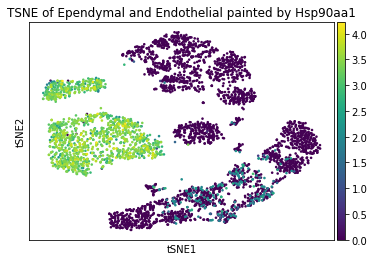

Hsp90ab1


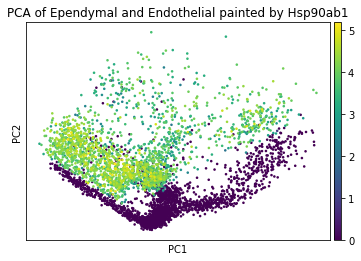

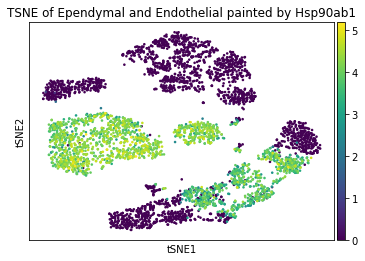

Hsph1


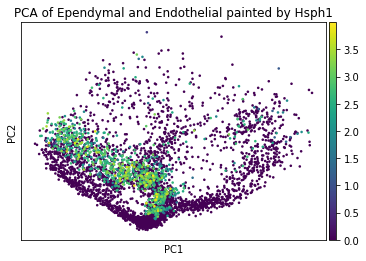

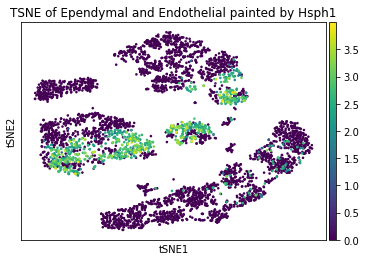

In [27]:
plots_two_clusters_scn('Ependymal and Endothelial', 'Ependymal and Endothelial', r_genes)


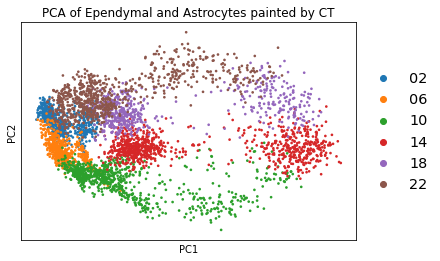

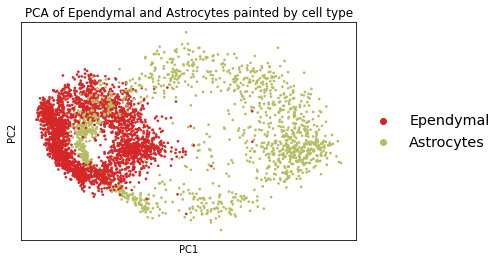

/Users/jonathankarin/.conda/envs/spctral_jan/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(


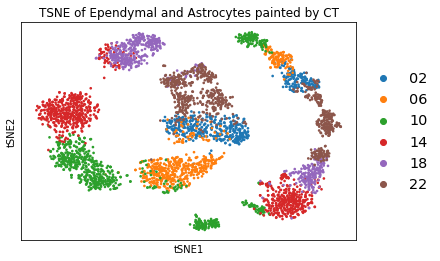

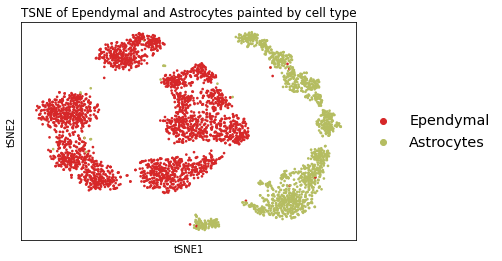

Bmal1
Bmal1
Dbp


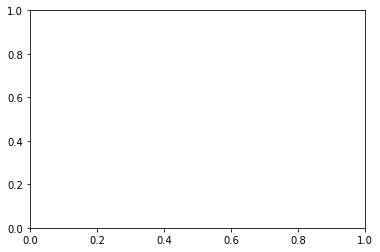

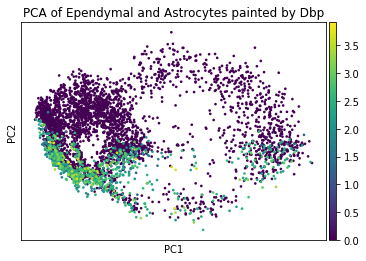

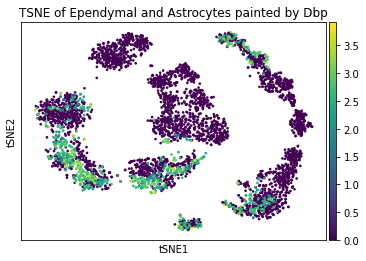

Nr1d1


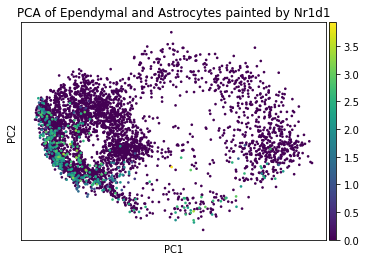

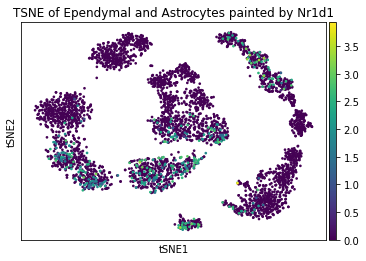

Per2


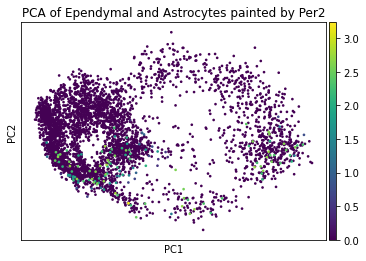

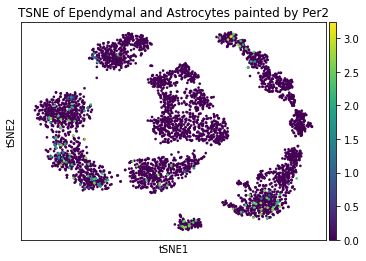

Ciart


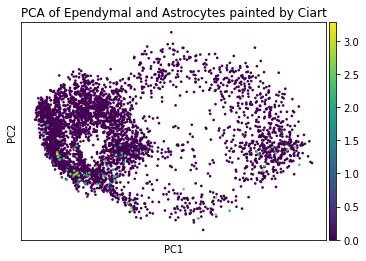

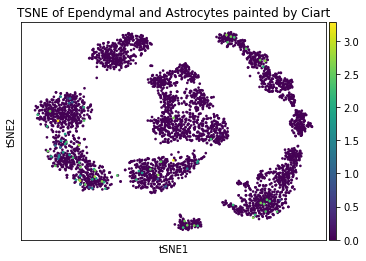

Nr1d2


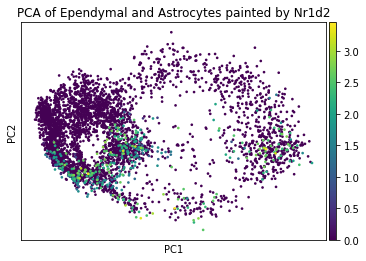

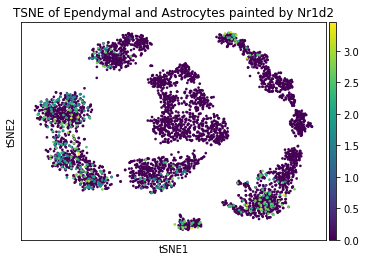

Per1


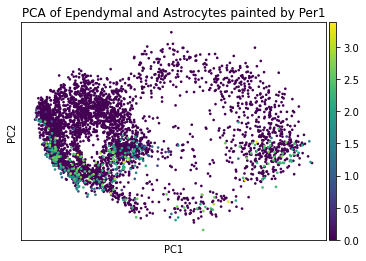

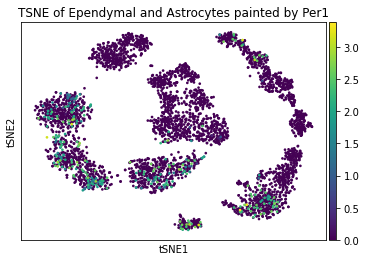

Tef


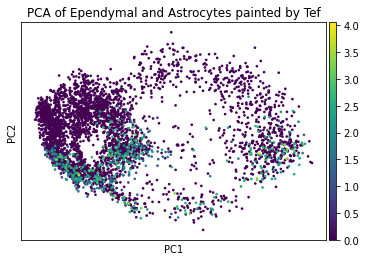

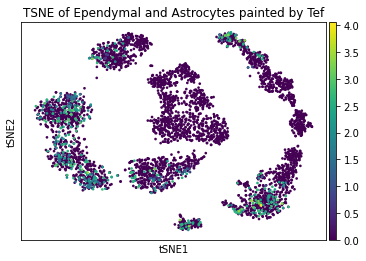

Ahsa2


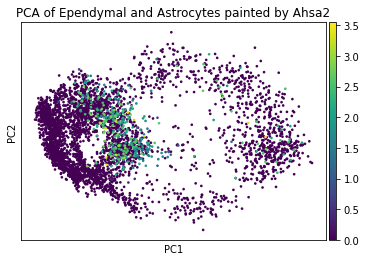

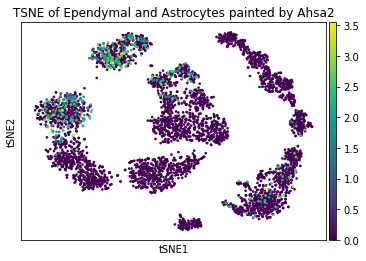

Cct8a
Cct8a
Hsp90aa1


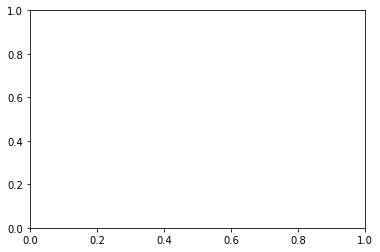

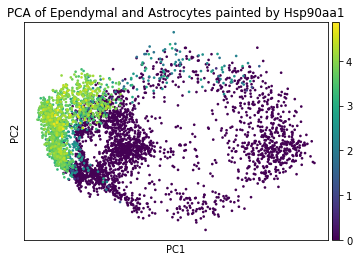

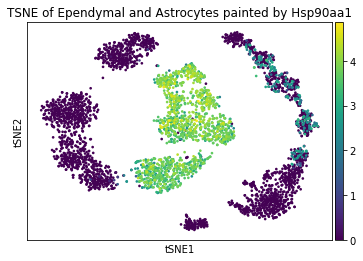

Hsp90ab1


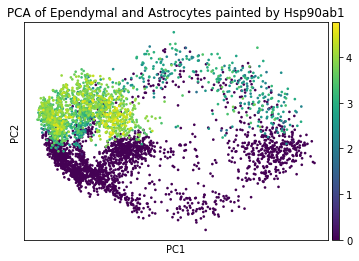

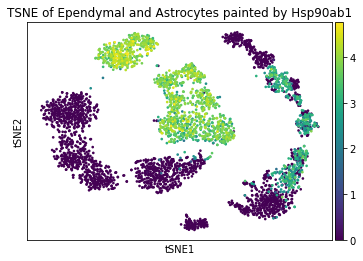

Hsph1


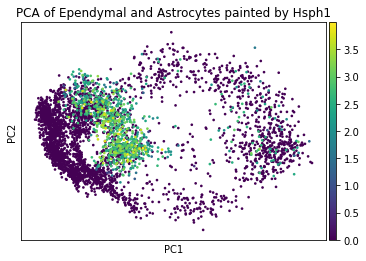

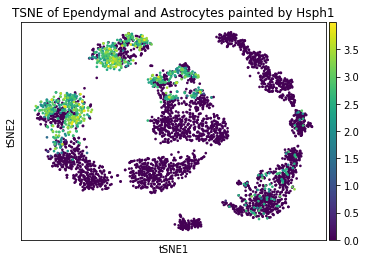

In [28]:
plots_two_clusters_scn('Ependymal and Astrocytes', 'Ependymal and Astrocytes', r_genes)

/Users/jonathankarin/.conda/envs/spctral_jan/lib/python3.9/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],
/Users/jonathankarin/.conda/envs/spctral_jan/lib/python3.9/site-packages/scanpy/preprocessing/_deprecated/highly_variable_genes.py:145: RuntimeWarning: invalid value encountered in log
  dispersion = np.log(dispersion)


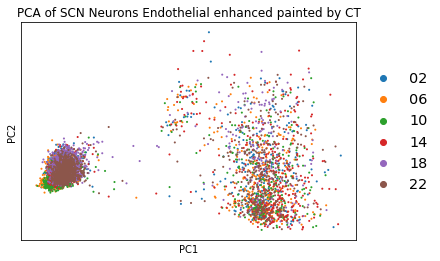

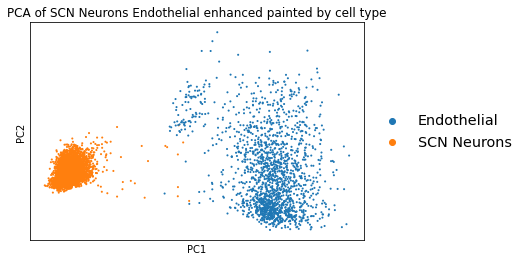

/Users/jonathankarin/.conda/envs/spctral_jan/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(


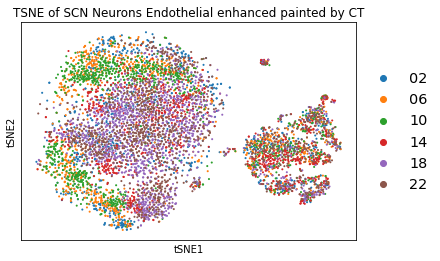

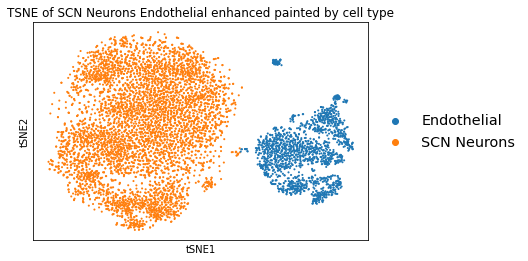

Bmal1
Bmal1
Dbp


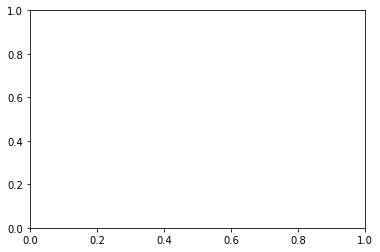

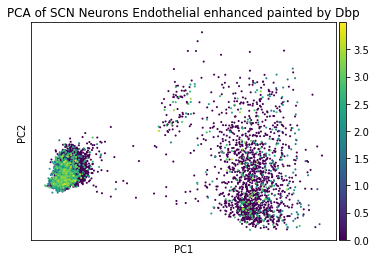

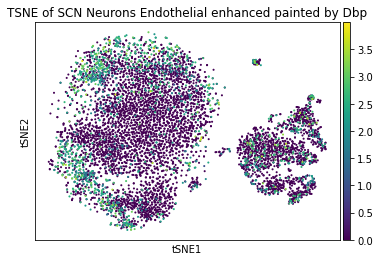

Nr1d1


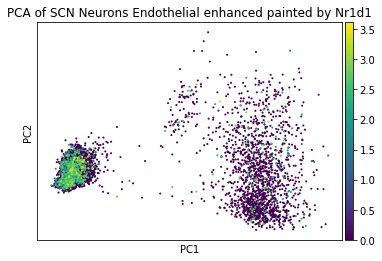

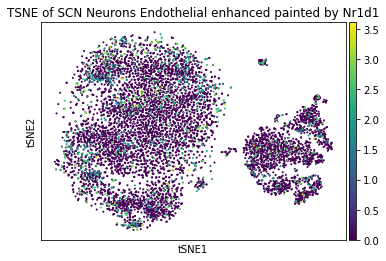

Per2
Per2
Ciart
Ciart
Nr1d2


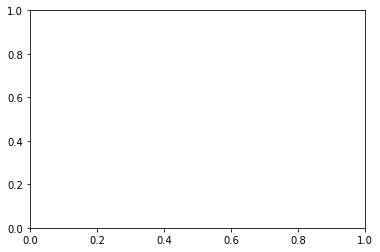

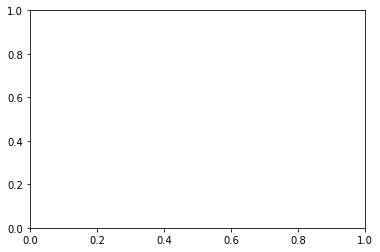

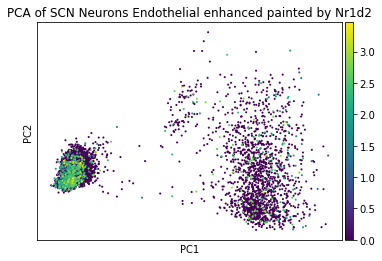

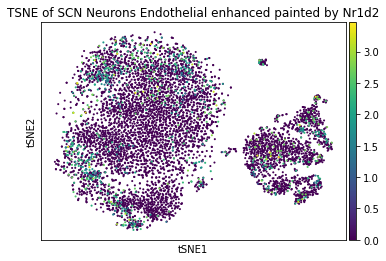

Per1


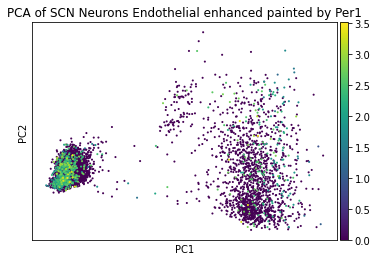

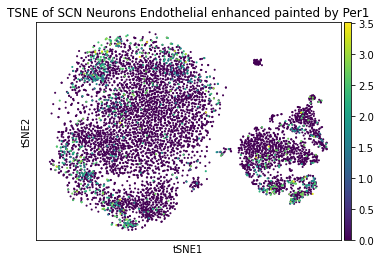

Tef
Tef
Ahsa2
Ahsa2
Cct8a
Cct8a
Hsp90aa1


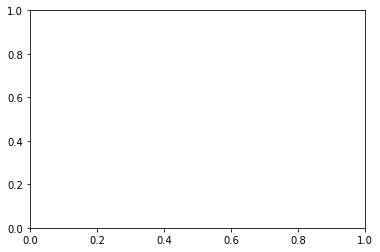

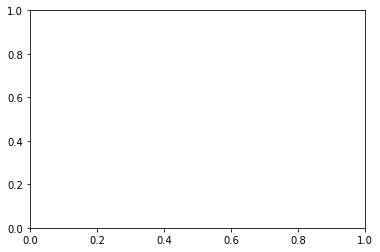

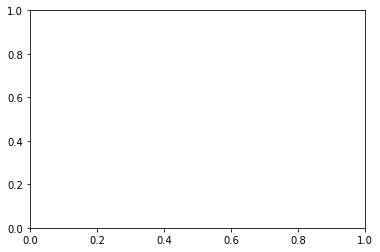

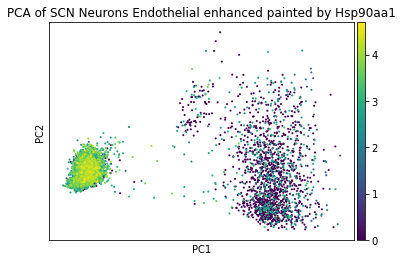

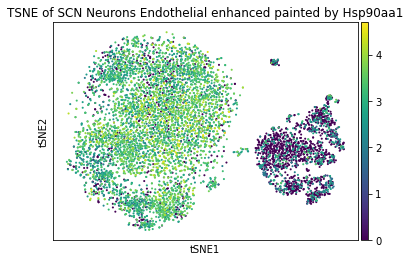

Hsp90ab1
Hsp90ab1
Hsph1
Hsph1
Iteration number: 
1
function value: 
88913.27283526727
Iteration number: 
26
function value: 
108147.32165788779
Iteration number: 
51
function value: 
117910.77786150824
Iteration number: 
76
function value: 
122292.63636373325
Iteration number: 
101
function value: 
124623.72378122796
Iteration number: 
126
function value: 
125842.31108370994


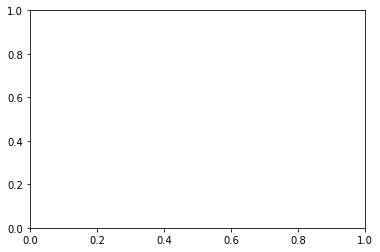

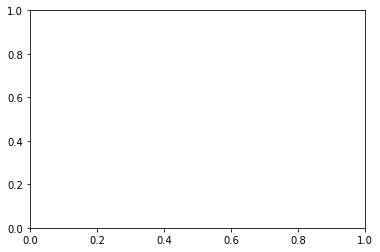

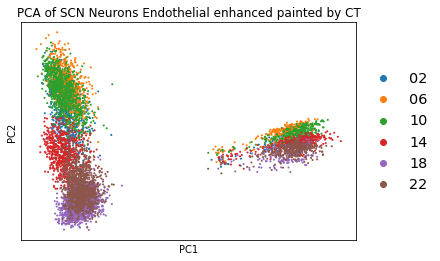

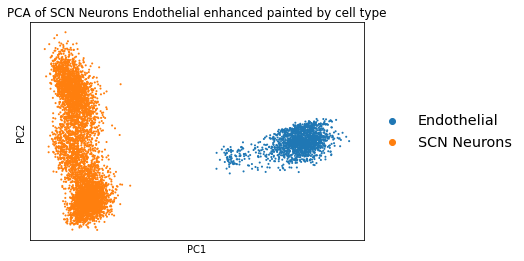

/Users/jonathankarin/.conda/envs/spctral_jan/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(


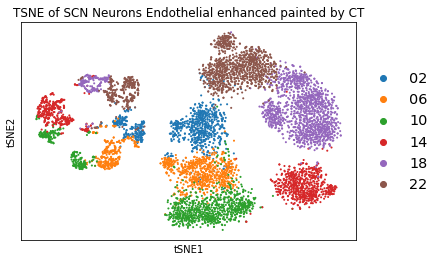

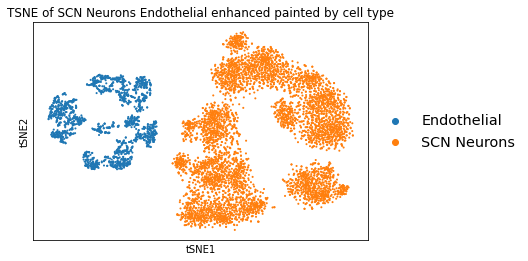

Bmal1
Bmal1
Dbp


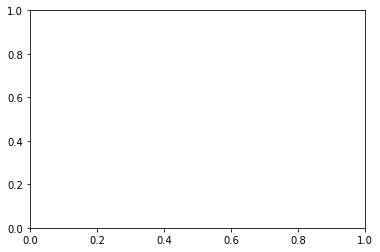

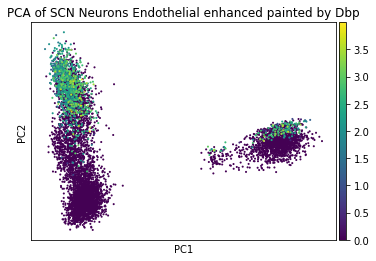

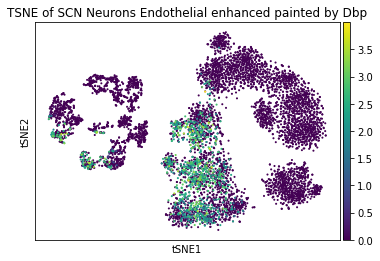

Nr1d1


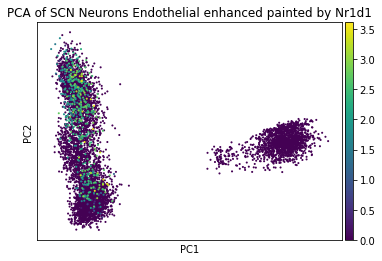

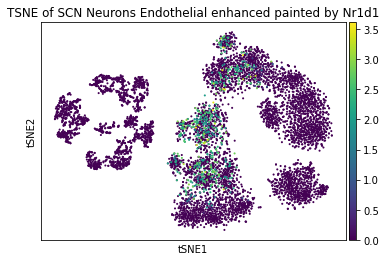

Per2
Per2
Ciart
Ciart
Nr1d2


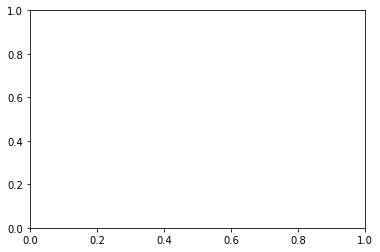

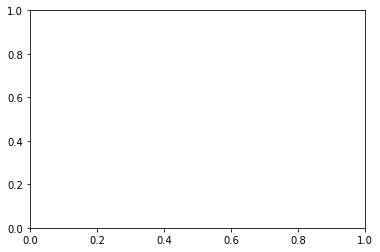

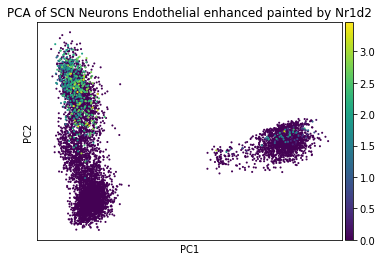

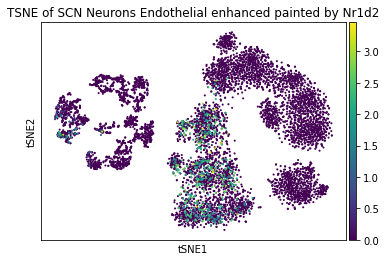

Per1


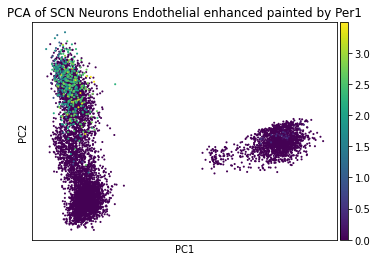

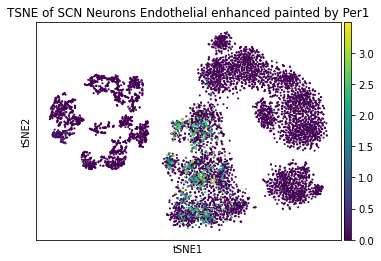

Tef
Tef
Ahsa2
Ahsa2
Cct8a
Cct8a
Hsp90aa1


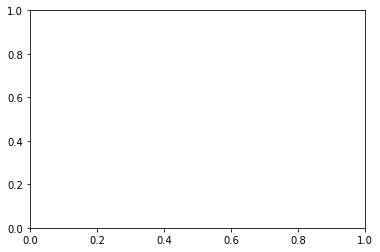

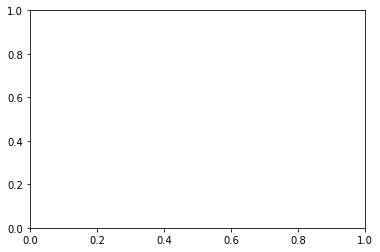

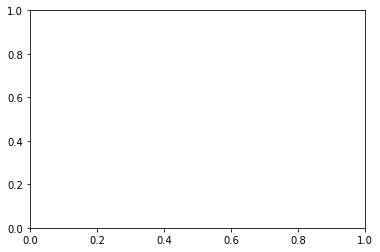

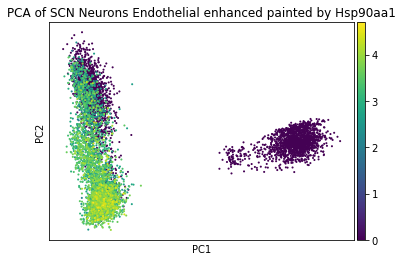

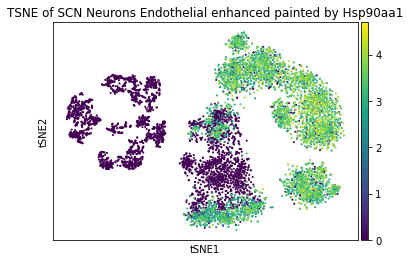

Hsp90ab1
Hsp90ab1
Hsph1
Hsph1


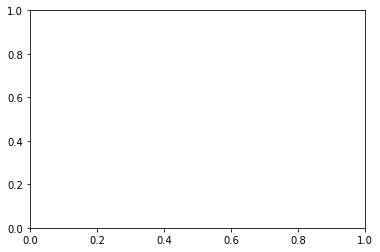

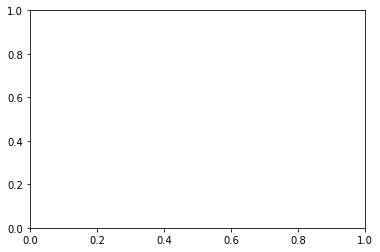

In [20]:
adata_scn_ep = enhance_two_cyclic_scn(adata, "SCN Neurons","Endothelial",en_regu=0.1,r_genes=r_genes, iterNum=150, hvg=7000)

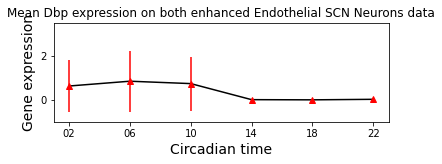

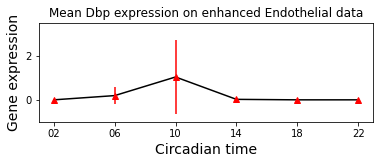

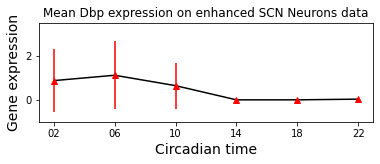

In [21]:
clusters = 'SCN Neurons_Endothelial'
adata_epi = sc.read("SCN/" + clusters+"_double_en" +".h5ad")
plt_mean_gene_double(adata_epi, 'Endothelial', 'SCN Neurons', 'Dbp' , up_lim=3.5 , down_lim=-1 , color='r')


/Users/jonathankarin/.conda/envs/spctral_jan/lib/python3.9/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],
/Users/jonathankarin/.conda/envs/spctral_jan/lib/python3.9/site-packages/scanpy/preprocessing/_deprecated/highly_variable_genes.py:145: RuntimeWarning: invalid value encountered in log
  dispersion = np.log(dispersion)


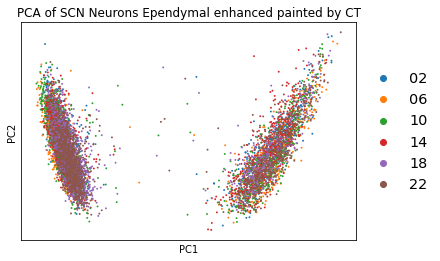

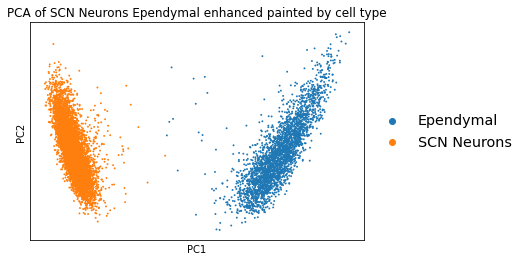

/Users/jonathankarin/.conda/envs/spctral_jan/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(


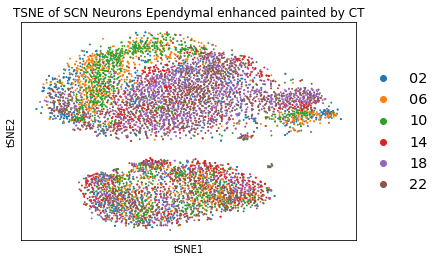

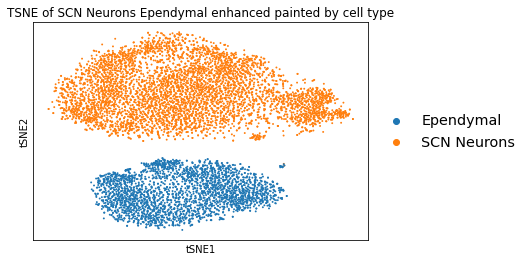

Bmal1
Bmal1
Dbp


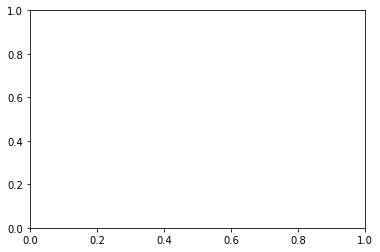

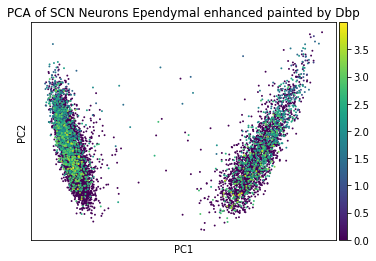

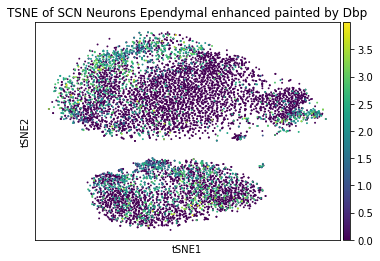

Nr1d1


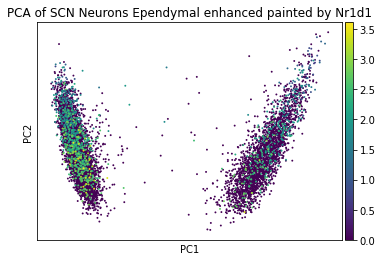

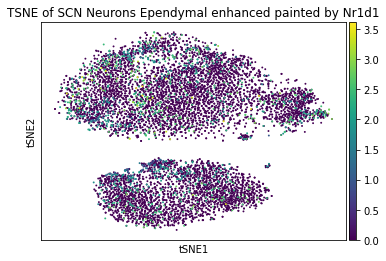

Per2
Per2
Ciart


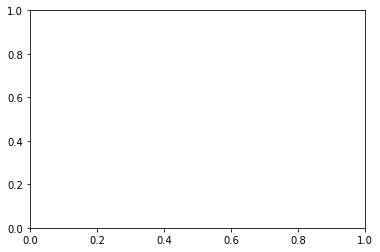

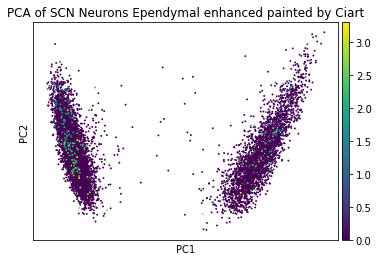

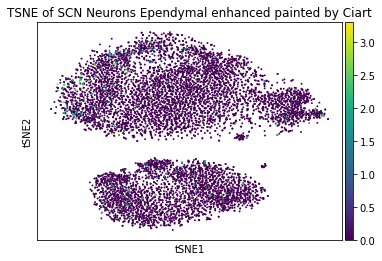

Nr1d2
Nr1d2
Per1


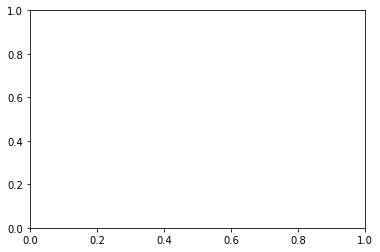

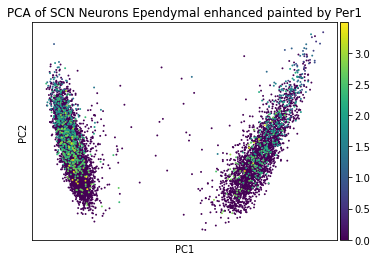

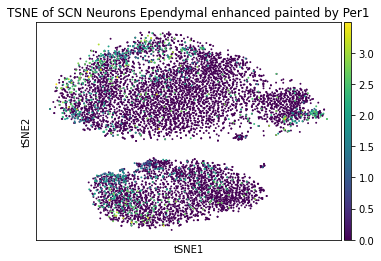

Tef
Tef
Ahsa2
Ahsa2
Cct8a
Cct8a
Hsp90aa1


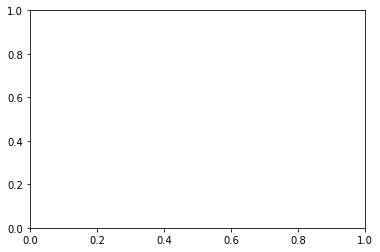

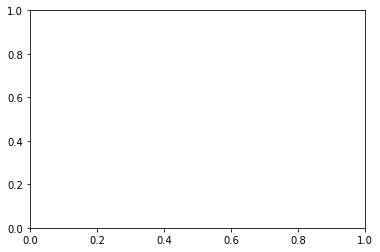

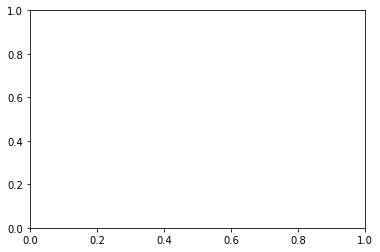

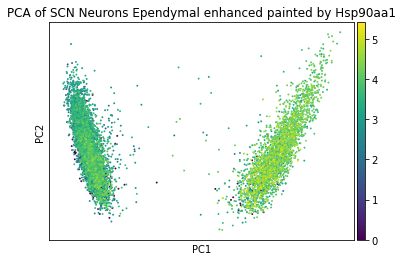

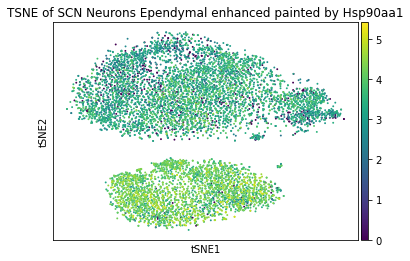

Hsp90ab1
Hsp90ab1
Hsph1
Hsph1
Iteration number: 
1
function value: 
60322.09658415313
Iteration number: 
26
function value: 
84577.31576582094
Iteration number: 
51
function value: 
103664.76270705226
Iteration number: 
76
function value: 
114154.8433383834
Iteration number: 
101
function value: 
118844.0731947522
Iteration number: 
126
function value: 
120927.27305837105


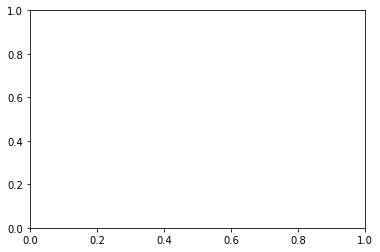

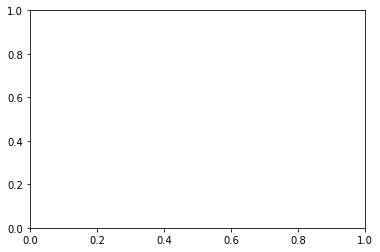

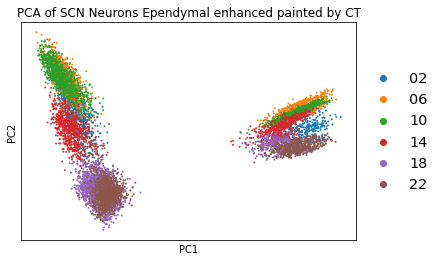

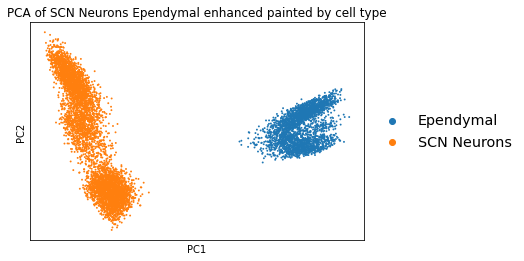

/Users/jonathankarin/.conda/envs/spctral_jan/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(


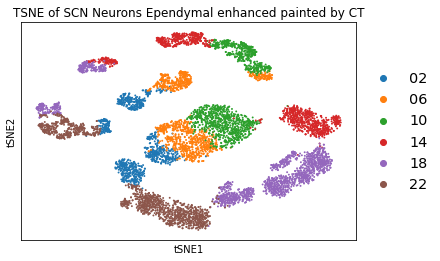

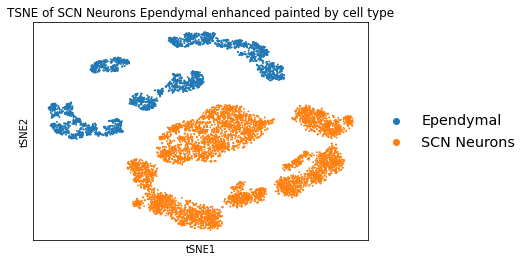

Bmal1
Bmal1
Dbp


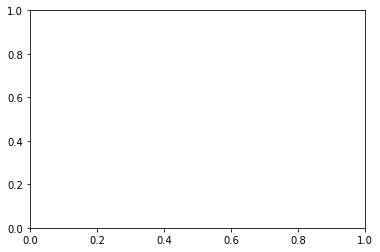

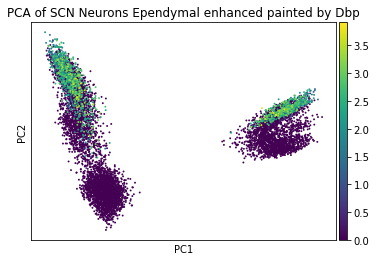

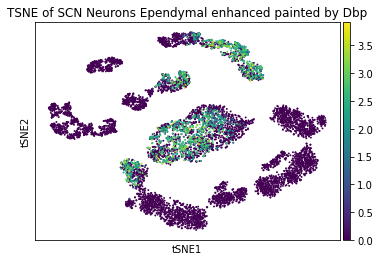

Nr1d1


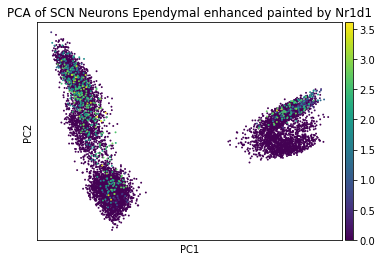

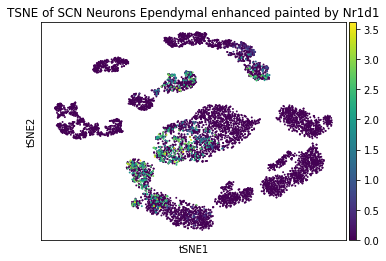

Per2
Per2
Ciart


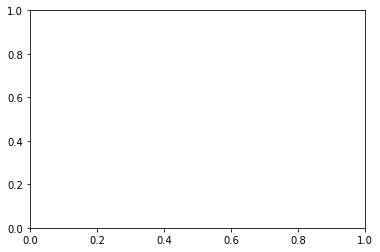

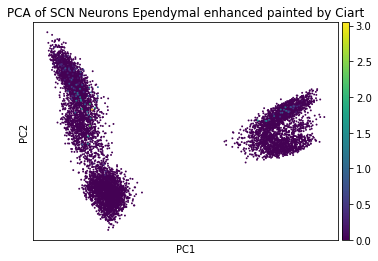

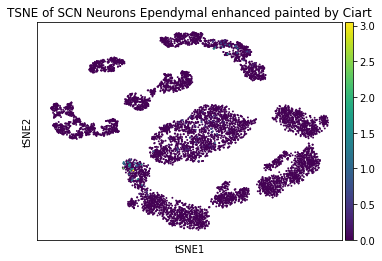

Nr1d2
Nr1d2
Per1


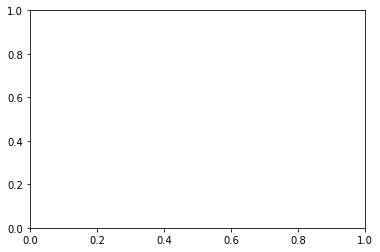

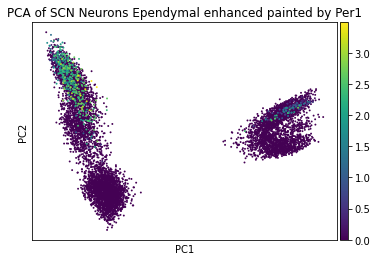

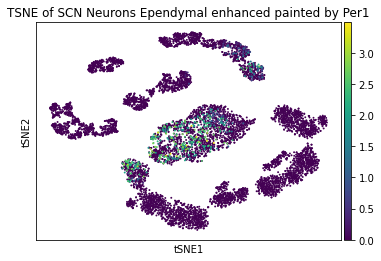

Tef
Tef
Ahsa2
Ahsa2
Cct8a
Cct8a
Hsp90aa1


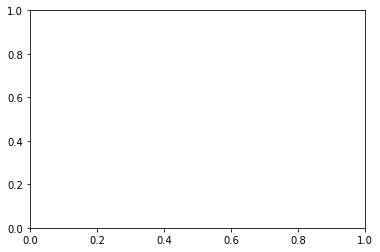

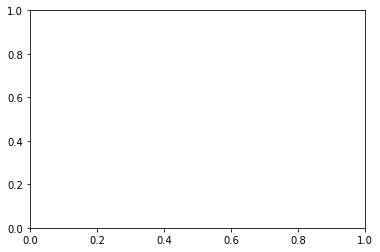

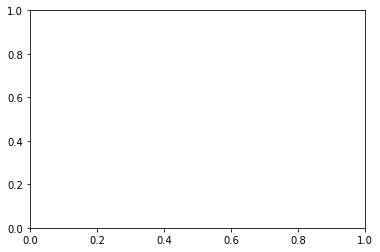

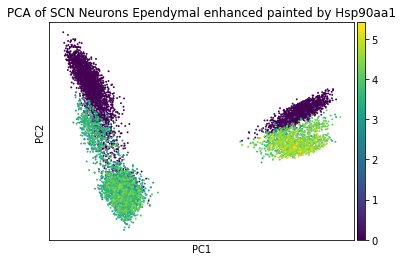

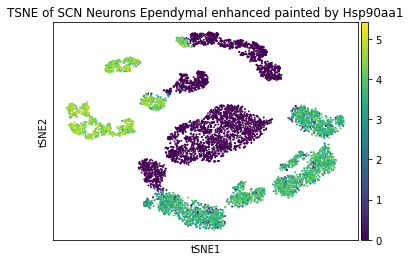

Hsp90ab1
Hsp90ab1
Hsph1
Hsph1


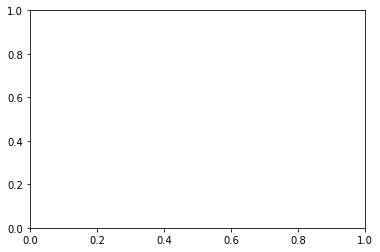

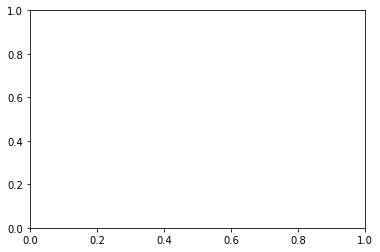

In [23]:
adata_scn_end = enhance_two_cyclic_scn(adata, "SCN Neurons","Ependymal",en_regu=0.1,r_genes=r_genes, iterNum=150, hvg=7000)


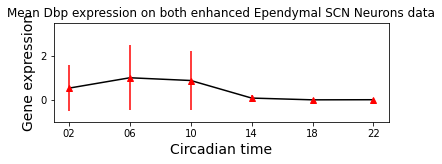

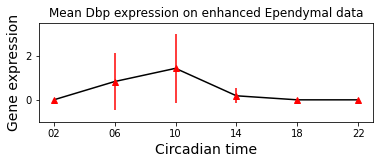

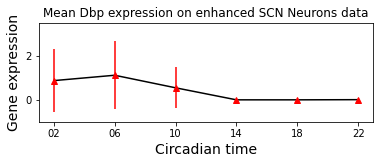

In [24]:
clusters = 'SCN Neurons_Ependymal'
adata_epi = sc.read("SCN/" + clusters+"_double_en" +".h5ad")
plt_mean_gene_double(adata_epi, 'Ependymal', 'SCN Neurons', 'Dbp' , up_lim=3.5 , down_lim=-1 , color='r')


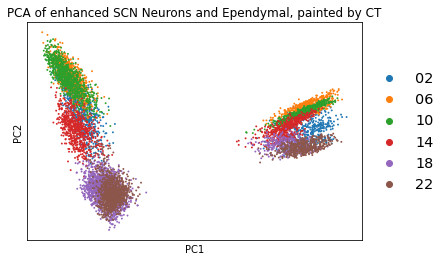

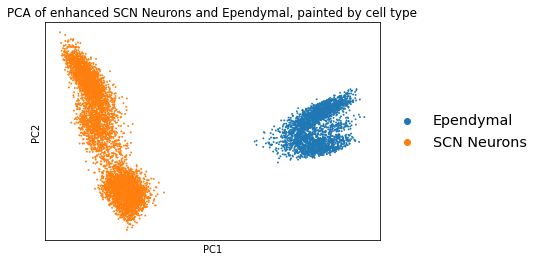

/Users/jonathankarin/.conda/envs/spctral_jan/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(


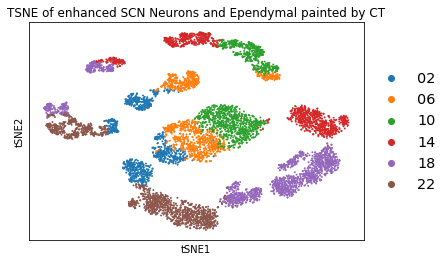

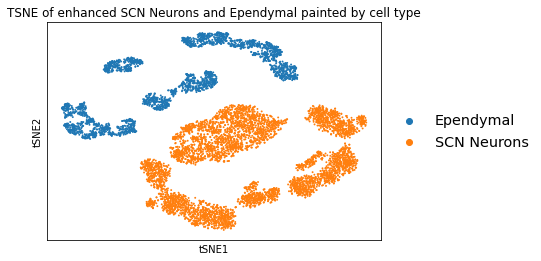

In [21]:
plots_double_clusters_scn_en(cluster2='Ependymal',
cluster1='SCN Neurons',
title='SCN Neurons and Ependymal'
)

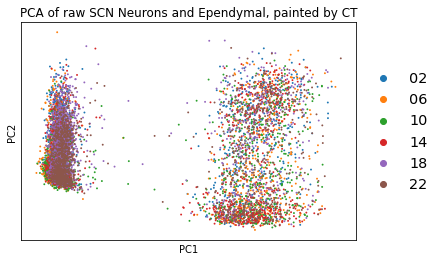

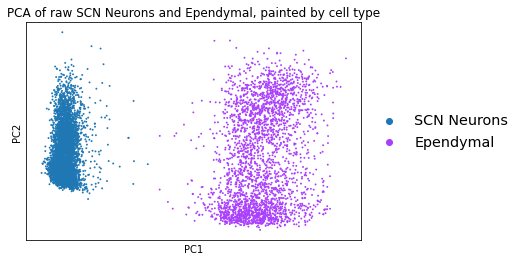

/Users/jonathankarin/.conda/envs/spctral_jan/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(


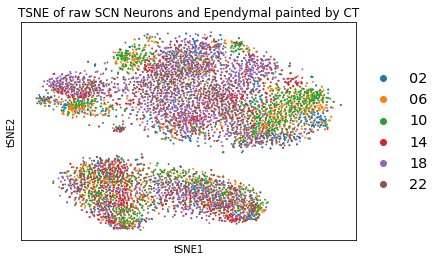

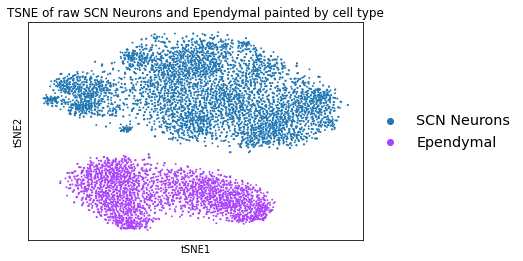

In [22]:
plots_double_clusters_scn_raw(cluster1='Ependymal',
cluster2='SCN Neurons',
title='SCN Neurons and Ependymal'
)

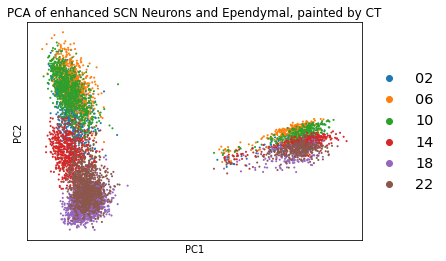

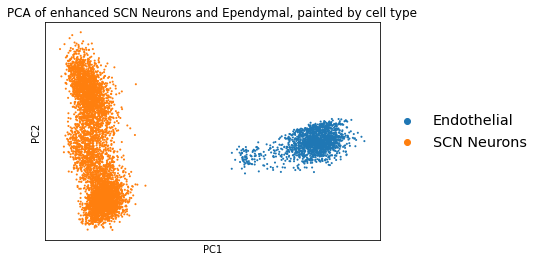

/Users/jonathankarin/.conda/envs/spctral_jan/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(


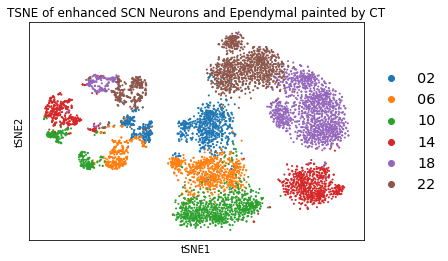

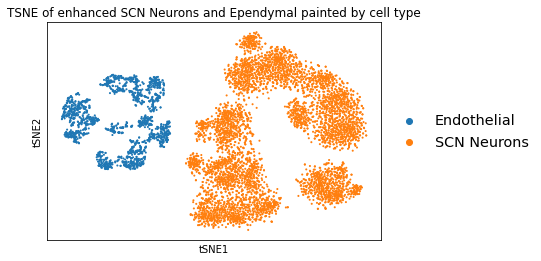

In [23]:
plots_double_clusters_scn_en(cluster2='Endothelial',
cluster1='SCN Neurons',
title='SCN Neurons and Ependymal'
)

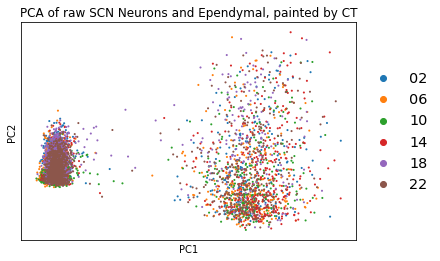

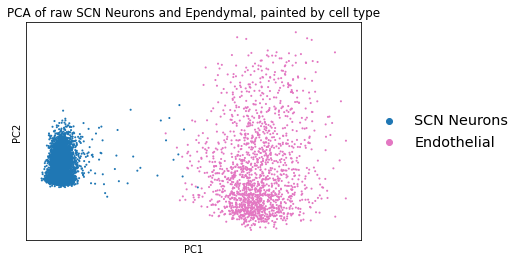

/Users/jonathankarin/.conda/envs/spctral_jan/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(


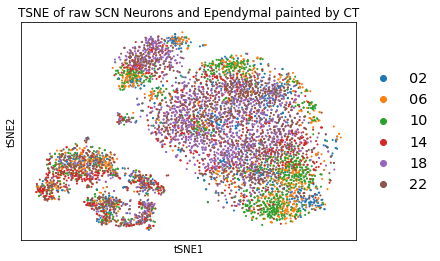

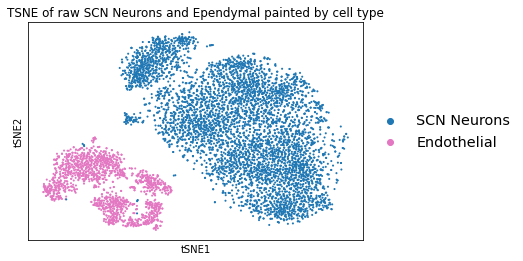

In [24]:
plots_double_clusters_scn_raw(cluster1='Endothelial',
cluster2='SCN Neurons',
title='SCN Neurons and Ependymal'
)